# Breast Cancer Classification

### ***A Fight Against Breast Cancer***

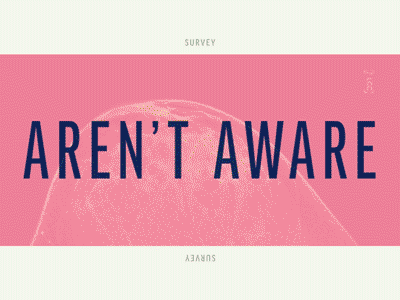


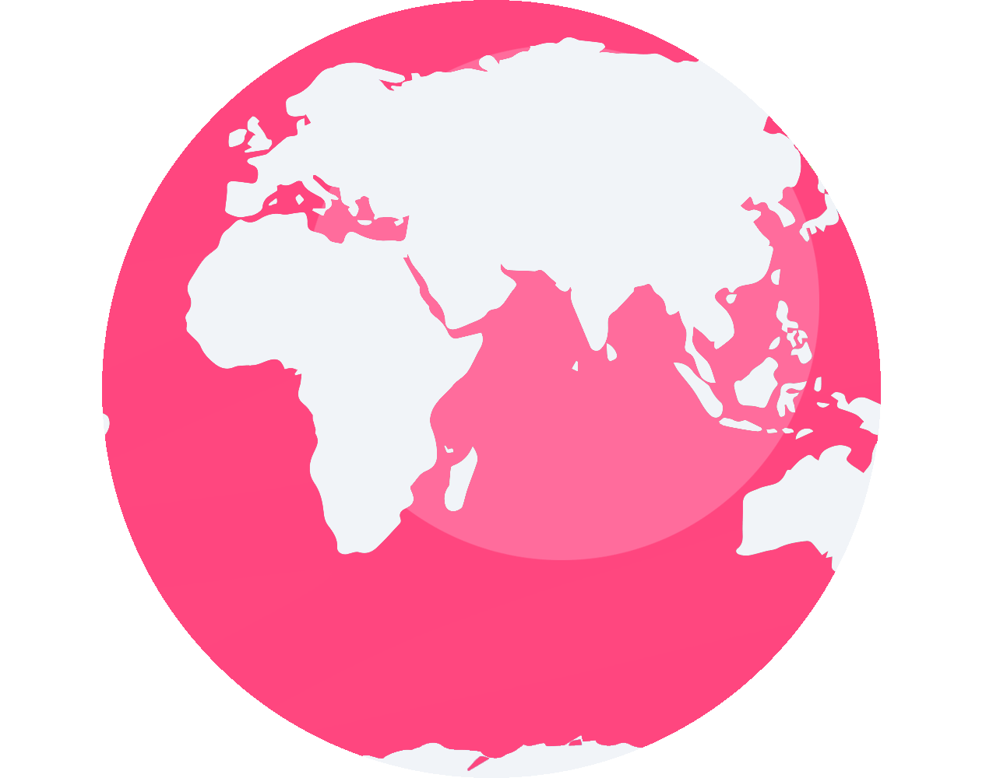


## Motivation/Problem Statement:--
Breast cancer is very big problem in women, data shoes that 2.1 Million of women having breast cancer in 2015.
With 79% of accuracy type breast cancer is detected by physicians & in Machine Learning this figures ranges around 90% 
(91-  97)%.
There are 2 types of tumers in breast cancer which are.. 1.Malignant(Spreads at faster rate in body  2.Benign(does not spreads faster in body).
The Benign Means to the Non-Presence of cancer in the patient.
We will use SVM-classifier to classify the type of cancer.
We use different features of tumer such as RADIUS,TEXTURE,PERIMETER,AREA,SMOOTHNESS

### LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.datasets import load_breast_cancer

### DATA

In [2]:
data = load_breast_cancer()
data.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [3]:
print(data['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 3 is Mean Radius, f

In [3]:
df = pd.DataFrame(np.c_[data['data'],data['target']],columns=np.append(data['feature_names'],['target']))

In [4]:
df.head(2)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0


### DATA VISUALIZATION

Here 0:Malignant , 1:Benign

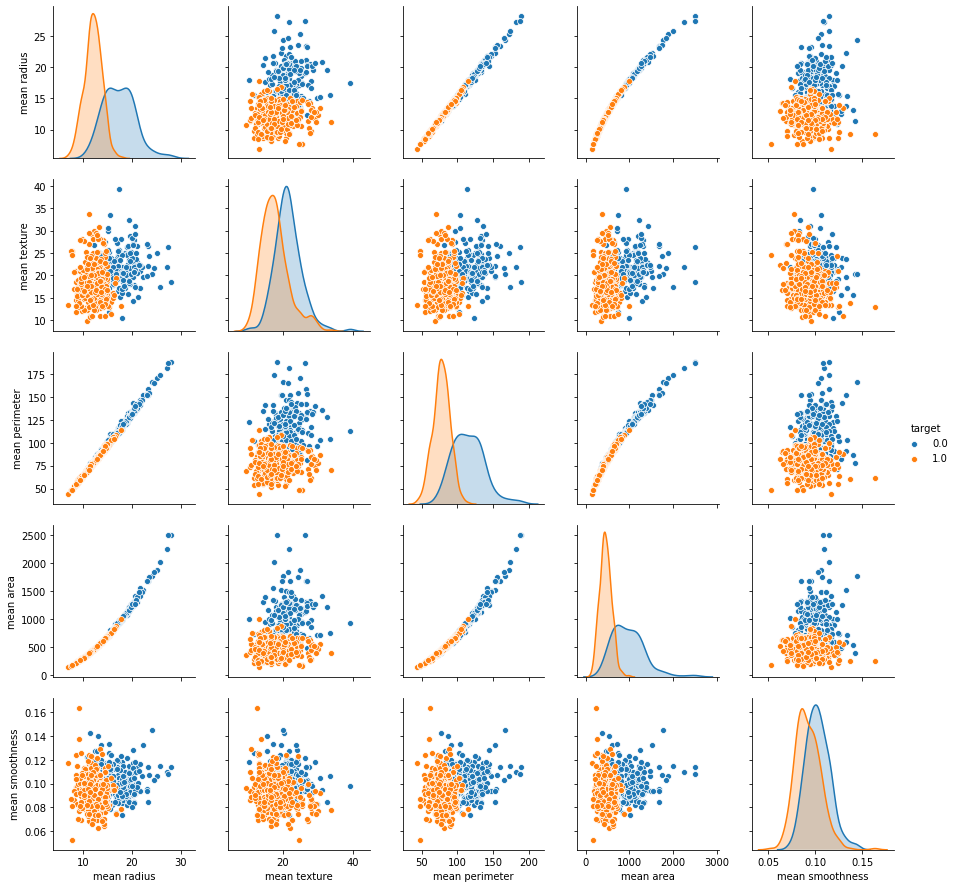

In [35]:
sns.pairplot(df,vars=['mean radius','mean texture','mean perimeter','mean area','mean smoothness'],hue='target')
plt.show()

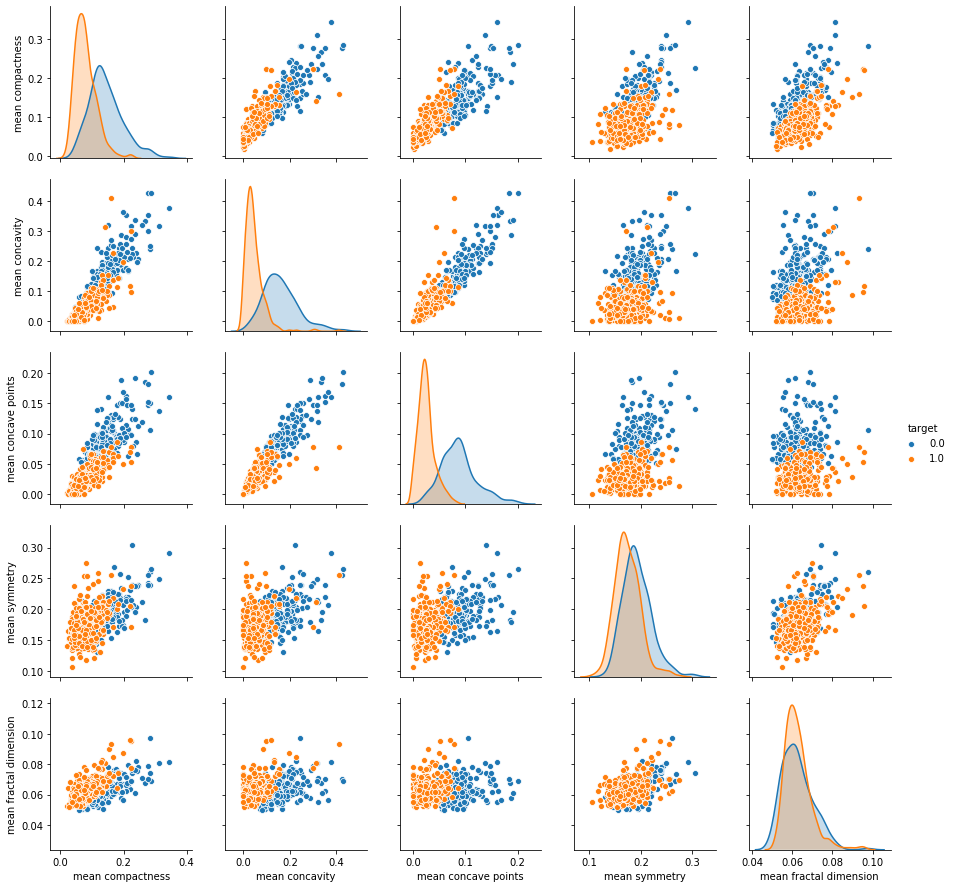

In [37]:
sns.pairplot(df,vars=['mean compactness', 'mean concavity','mean concave points', 'mean symmetry', 'mean fractal dimension'],hue='target')
plt.show()

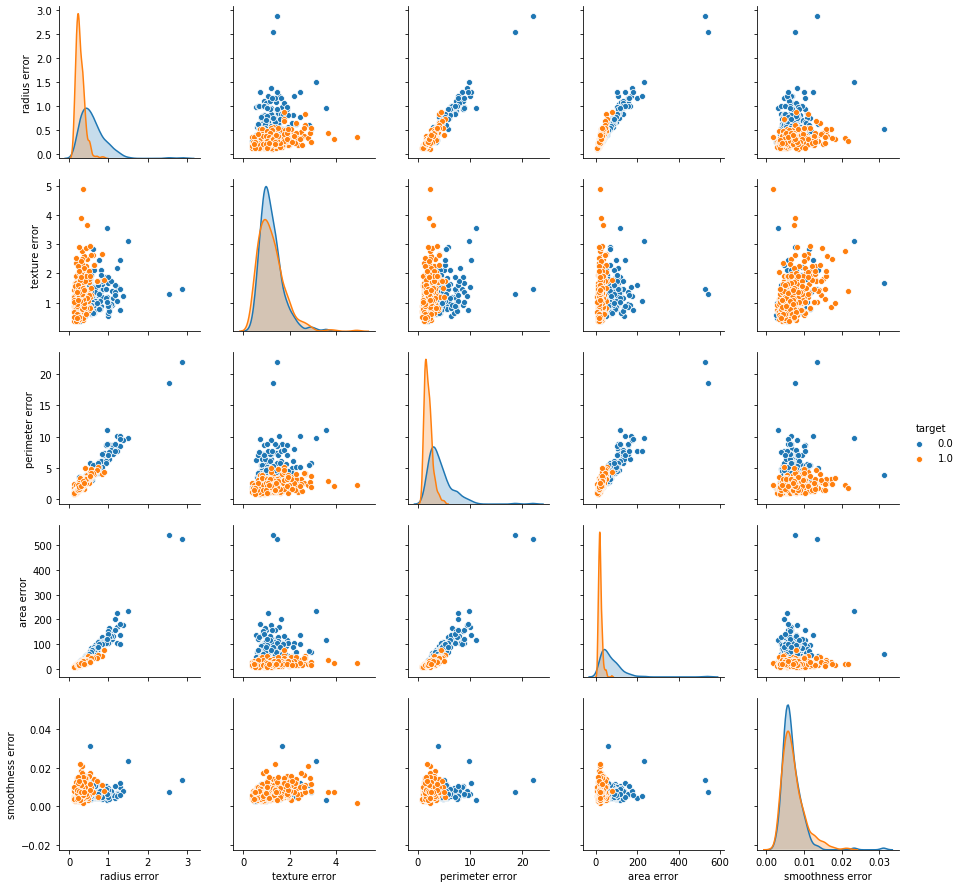

In [39]:
sns.pairplot(df,vars=['radius error', 'texture error', 'perimeter error', 'area error','smoothness error'],hue='target')
plt.show()

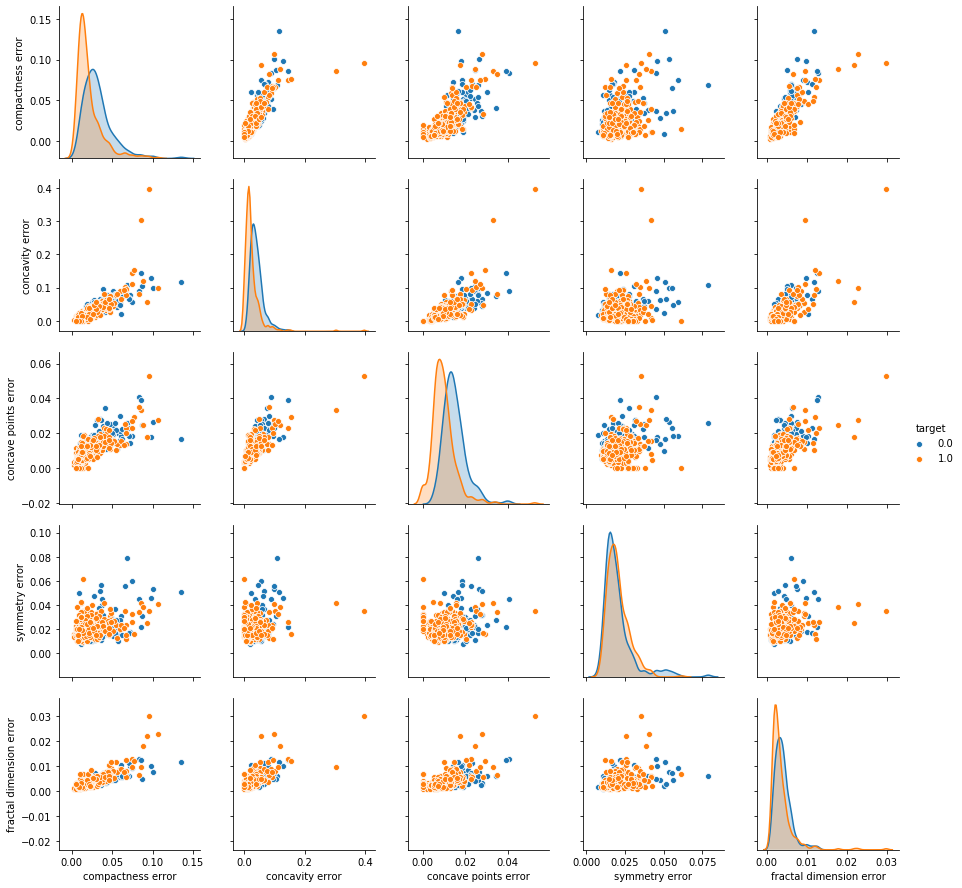

In [41]:
sns.pairplot(df,vars=['compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error'],hue='target')
plt.show()

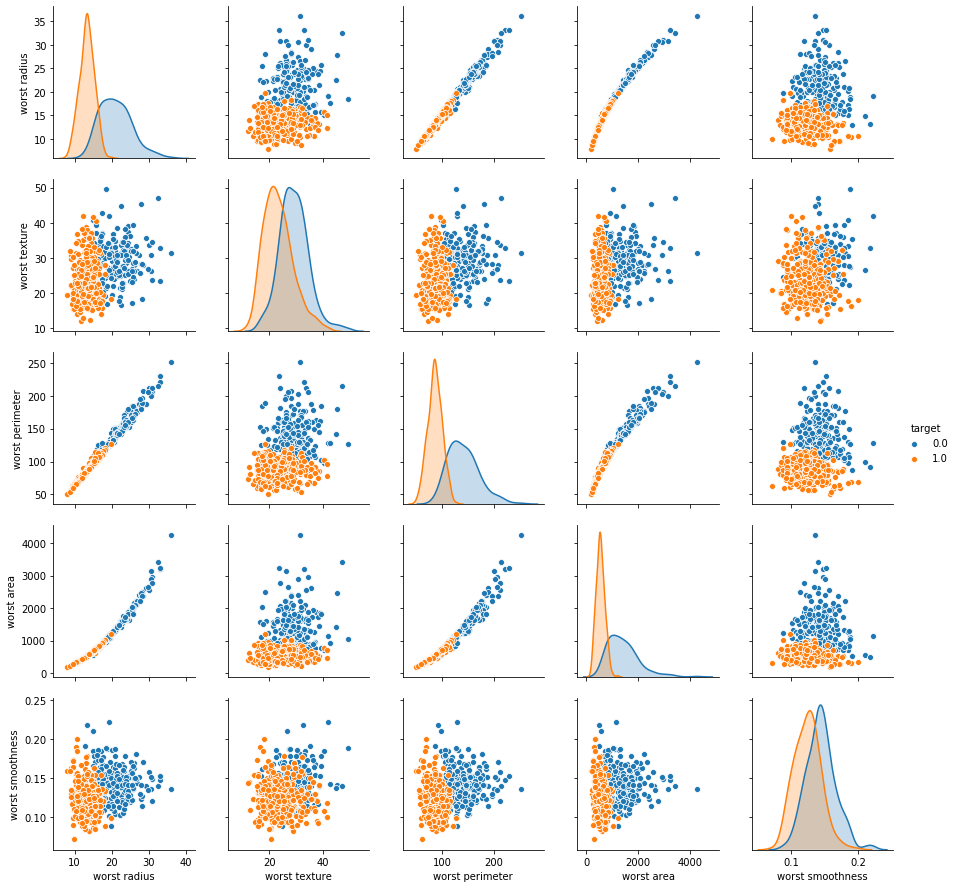

In [43]:
sns.pairplot(df,vars=['worst radius', 'worst texture', 'worst perimeter', 'worst area','worst smoothness'],hue='target')
plt.show()

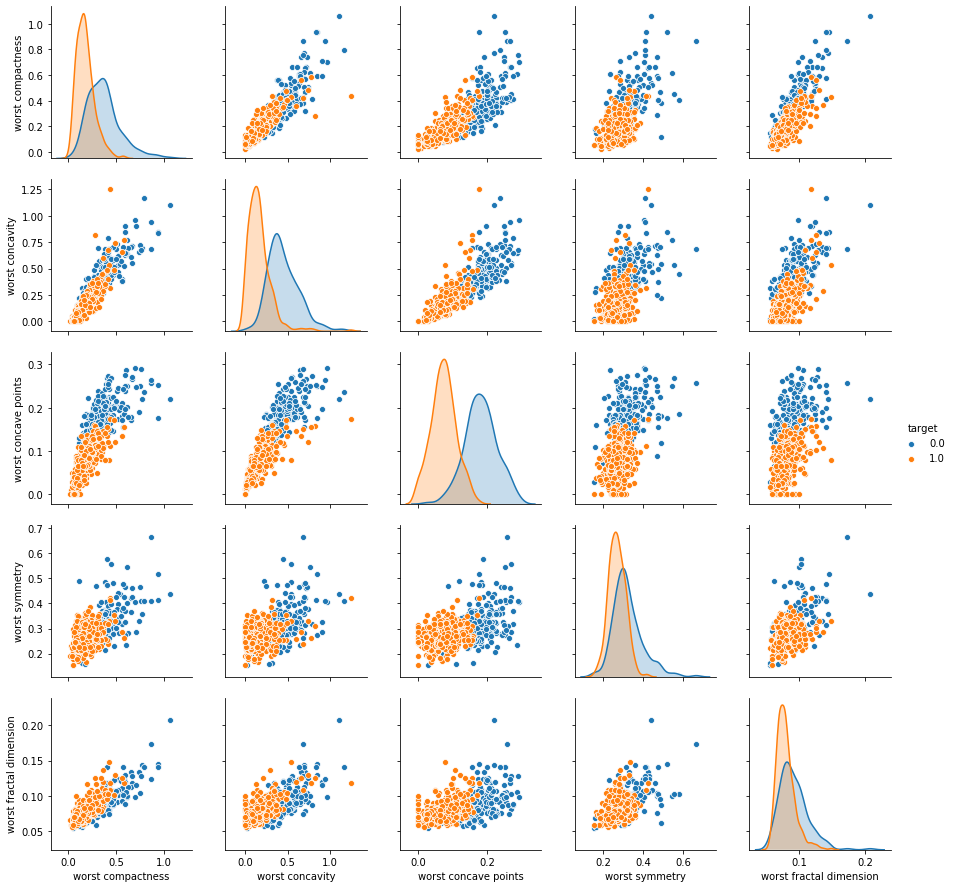

In [44]:
sns.pairplot(df,vars=['worst compactness', 'worst concavity','worst concave points', 'worst symmetry', 'worst fractal dimension'],hue='target')
plt.show()

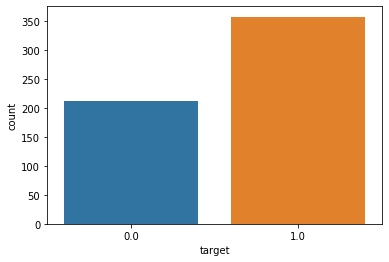

In [14]:
sns.countplot(df['target'])
plt.show()

In [31]:
df.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'target'],
      dtype='object')

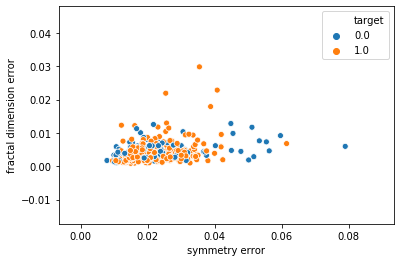

In [33]:
sns.scatterplot(x='symmetry error',y='fractal dimension error',hue='target',data=df)
plt.show()

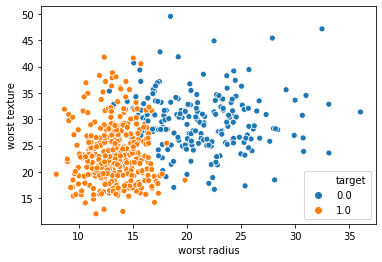

In [34]:
sns.scatterplot(x='worst radius',y='worst texture',hue='target',data=df)
plt.show()

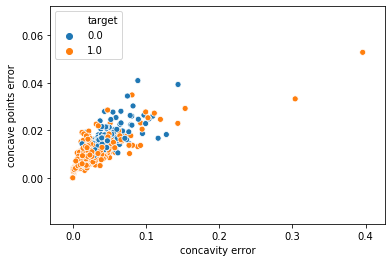

In [30]:
sns.scatterplot(x='concavity error',y='concave points error',hue='target',data=df)
plt.show()

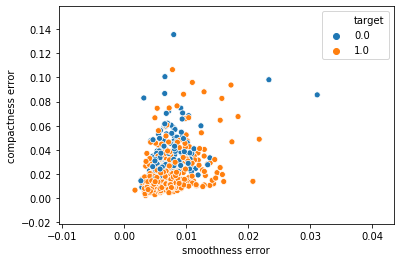

In [28]:
sns.scatterplot(x='smoothness error',y='compactness error',hue='target',data=df)
plt.show()

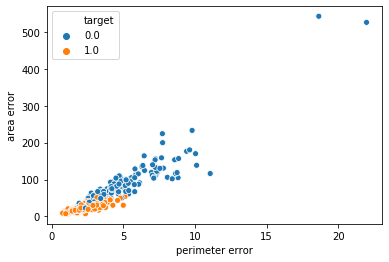

In [26]:
sns.scatterplot(x='perimeter error',y='area error',hue='target',data=df)
plt.show()

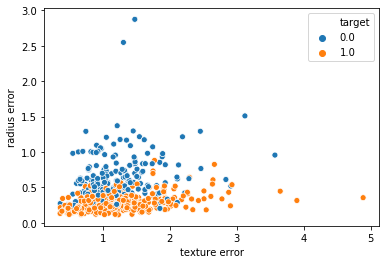

In [24]:
sns.scatterplot(x='texture error',y='radius error',hue='target',data=df)
plt.show()

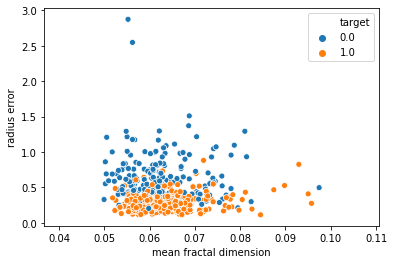

In [22]:
sns.scatterplot(x='mean fractal dimension',y='radius error',hue='target',data=df)
plt.show()

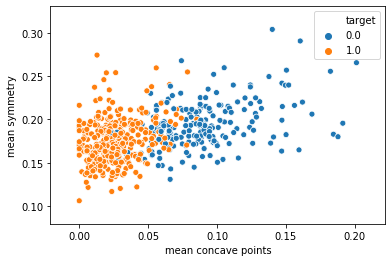

In [19]:
sns.scatterplot(x='mean concave points',y='mean symmetry',hue='target',data=df)
plt.show()

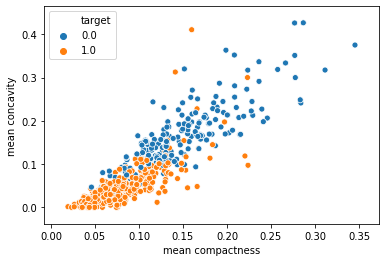

In [17]:
sns.scatterplot(x='mean compactness',y='mean concavity',hue='target',data=df)
plt.show()

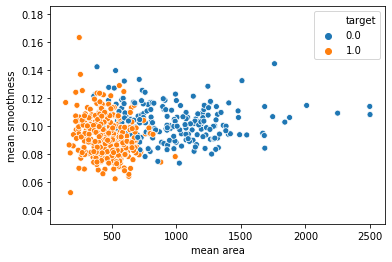

In [12]:
sns.scatterplot(x='mean area',y='mean smoothness',hue='target',data=df)
plt.show()

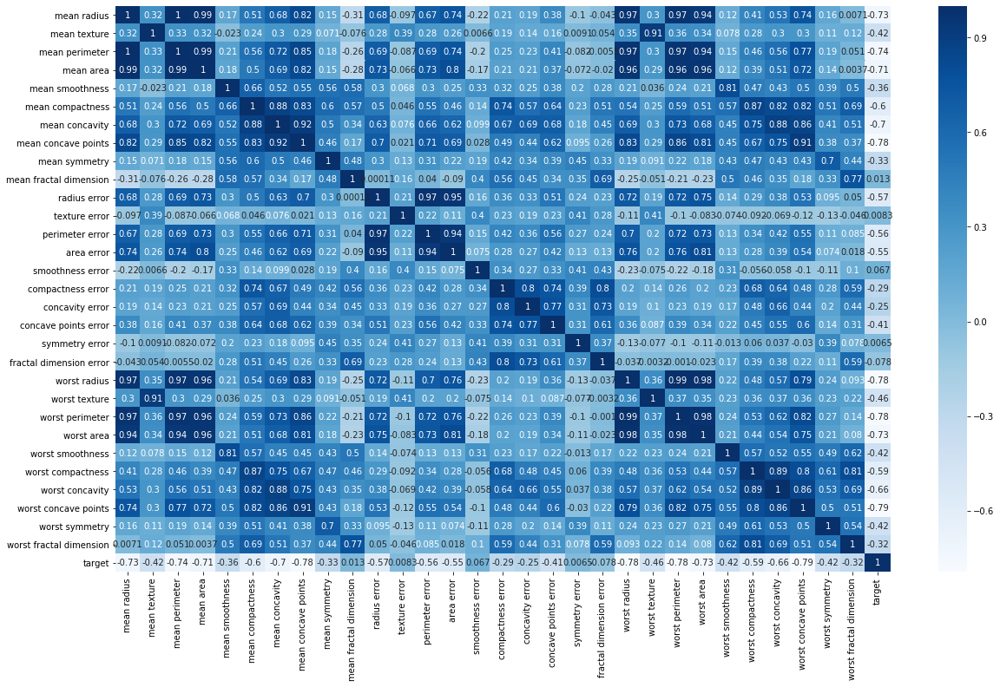

In [5]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(),annot=True,cmap='Blues')
plt.show()

### MODEL TRAINING (FINDING A SOLUTION TO THE PROBLEM)

In [7]:
X= df.drop(['target'],axis=1)

In [8]:
y = df['target']

In [10]:
from sklearn.model_selection import train_test_split

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [14]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((455, 30), (114, 30), (455,), (114,))

In [15]:
from sklearn.svm import SVC

In [16]:
svc_model = SVC()

In [101]:
svc_model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

### Model Evaluation

In [23]:
y_pred = svc_model.predict(X_test)
y_pred

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [22]:
from sklearn.metrics import confusion_matrix,classification_report

In [27]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[ 0, 48],
       [ 0, 66]], dtype=int64)

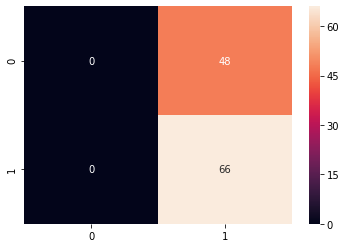

In [29]:
sns.heatmap(cm,annot=True)

## ===> Bad predictions
Let's Run better model

### Model Improvement
We improve model by
`1. Feature Scaling`
`2. SVM parameters Optimization(tuning) i.e. optimization of C & gamma value`
We'll scale the features using min-max scale approach & use below formula to normalize the data.

**X'= (X-Xmin)/Range** will give all data points in range of [0,1]

**C Parameter:** `Controls trade-off between classifying training points correctly & having a smooth decision boundary` **Small C** : `makes cost(penalty) of misclassification low(soft boundary)` ; **Large C** : `Makes cost of misclassification high(hard margin), it tries to cover all the data points which potentially leads to over fit`

**Gamma Parameter:** `Controls how far the influence of a single training set reaches` **Small Gamma:** `has far reach(more generalized solution` ; **Large Gamma:** `has close reach to the data points near the max marging Hyperplane i.e. close data points have high weight`

**Question is how can we optimize these parameters ?**

**We use Grid-search method to get best C & gamma**

#### 1. Normalization

In [42]:
from sklearn.preprocessing import minmax_scale

In [44]:
df_scaled = minmax_scale(df)

In [49]:
df_scaled = pd.DataFrame(df_scaled,columns=np.append(data['feature_names'],['target']))

In [52]:
df_scaled.head(1)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.70314,0.731113,0.686364,0.605518,...,0.141525,0.66831,0.450698,0.601136,0.619292,0.56861,0.912027,0.598462,0.418864,0.0


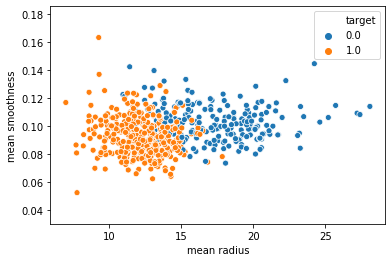

In [55]:
sns.scatterplot(df['mean radius'],df['mean smoothness'],hue=df['target'])
plt.show()

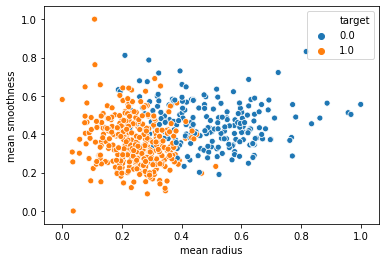

In [56]:
sns.scatterplot(df_scaled['mean radius'],df_scaled['mean smoothness'],hue=df_scaled['target'])
plt.show()

**We can see that the scaled scatterplot is more clearly classifying the 2 classes**

In [59]:
X = df_scaled.drop('target',axis=1)
y = df_scaled['target']

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [63]:
svc_model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [65]:
y_pred = svc_model.predict(X_test)
y_pred

array([0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0.,
       1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1.,
       1., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1., 1., 1., 1., 1.,
       1., 0., 1., 0., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1., 1., 0.,
       1., 1., 0., 0., 1., 0., 1., 1., 1., 0., 0., 1.])

In [66]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[43,  5],
       [ 0, 66]], dtype=int64)

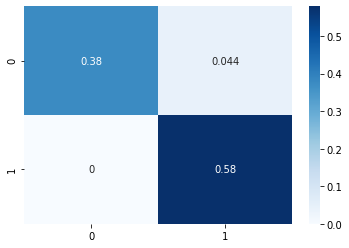

In [70]:
sns.heatmap(cm/cm.sum(),annot=True,cmap='Blues')
plt.show()

In [71]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95        48
         1.0       0.93      1.00      0.96        66

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



Here accuary looks good

#### 2.Model Paramter tuning

Note: Here we are using grid search method to get best parameter values

In [78]:
param_grid = {'C':[.1,1,10,100], 'gamma':[1,.1,.01,.001],'kernel':['rbf']}  # rbf:radial basis function

In [79]:
from sklearn.model_selection import GridSearchCV

In [80]:
# verbose shows how many values that we want to display while searching for grid
grid = GridSearchCV(SVC(), param_grid, refit=True, verbose= 4)

In [103]:
grid.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.980, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.921, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.947, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.882, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.875, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.868, total=   0.1s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0

[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    3.6s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=4)

In [84]:
grid.best_params_

{'C': 10, 'gamma': 1, 'kernel': 'rbf'}

In [86]:
y_grid_pred = grid.predict(X_test)
y_grid_pred

array([0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0., 0., 0., 0.,
       1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1.,
       1., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1., 1., 1., 1., 1.,
       1., 0., 1., 0., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1., 1., 0.,
       1., 1., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0.])

In [87]:
cm = confusion_matrix(y_test,y_grid_pred)
cm

array([[46,  2],
       [ 0, 66]], dtype=int64)

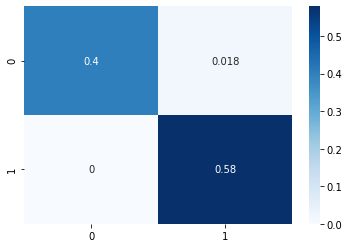

In [88]:
sns.heatmap(cm/cm.sum(),annot=True,cmap='Blues')
plt.show()

Here we are misclassifying only 2 points

Here we can observe that the prediction of 2 misclassified points shows that the tumer is Malignant(class 0) but it is actually Benign which is not a serious error

In [91]:
print(classification_report(y_test,y_grid_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98        48
         1.0       0.97      1.00      0.99        66

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



### Conclusion:
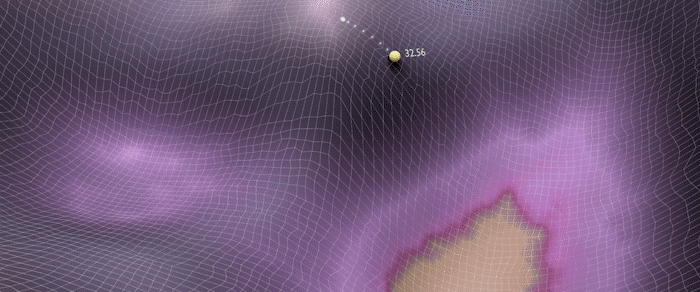

Here we conclude that the Machine leaning model is able to classify tumers into malignant & Benign with 98% of accuracy